In [2]:
%load_ext autoreload
%autoreload 2
import sys
import numpy as np

sys.path.append('B://workspace/tensorflow')

stations = [
    {
        'position': [-100, -40],
        'detail': '100°W, 40°S',
    }
]

读取月份: 2004-1
读取月份: 2004-2
读取月份: 2004-3
读取月份: 2004-4
读取月份: 2004-5
读取月份: 2004-6
读取月份: 2004-7
读取月份: 2004-8
读取月份: 2004-9
读取月份: 2004-10
读取月份: 2004-11
读取月份: 2004-12
读取月份: 2005-1
读取月份: 2005-2
读取月份: 2005-3
读取月份: 2005-4
读取月份: 2005-5
读取月份: 2005-6
读取月份: 2005-7
读取月份: 2005-8
读取月份: 2005-9
读取月份: 2005-10
读取月份: 2005-11
读取月份: 2005-12
读取月份: 2006-1
读取月份: 2006-2
读取月份: 2006-3
读取月份: 2006-4
读取月份: 2006-5
读取月份: 2006-6
读取月份: 2006-7
读取月份: 2006-8
读取月份: 2006-9
读取月份: 2006-10
读取月份: 2006-11
读取月份: 2006-12
读取月份: 2007-1
读取月份: 2007-2
读取月份: 2007-3
读取月份: 2007-4
读取月份: 2007-5
读取月份: 2007-6
读取月份: 2007-7
读取月份: 2007-8
读取月份: 2007-9
读取月份: 2007-10
读取月份: 2007-11
读取月份: 2007-12
读取月份: 2008-1
读取月份: 2008-2
读取月份: 2008-3
读取月份: 2008-4
读取月份: 2008-5
读取月份: 2008-6
读取月份: 2008-7
读取月份: 2008-8
读取月份: 2008-9
读取月份: 2008-10
读取月份: 2008-11
读取月份: 2008-12
读取月份: 2009-1
读取月份: 2009-2
读取月份: 2009-3
读取月份: 2009-4
读取月份: 2009-5
读取月份: 2009-6
读取月份: 2009-7
读取月份: 2009-8
读取月份: 2009-9
读取月份: 2009-10
读取月份: 2009-11
读取月份: 2009-12
读取月份: 2010-1
读取月份: 2010-2
读取月份: 2010-3
读取月份: 2

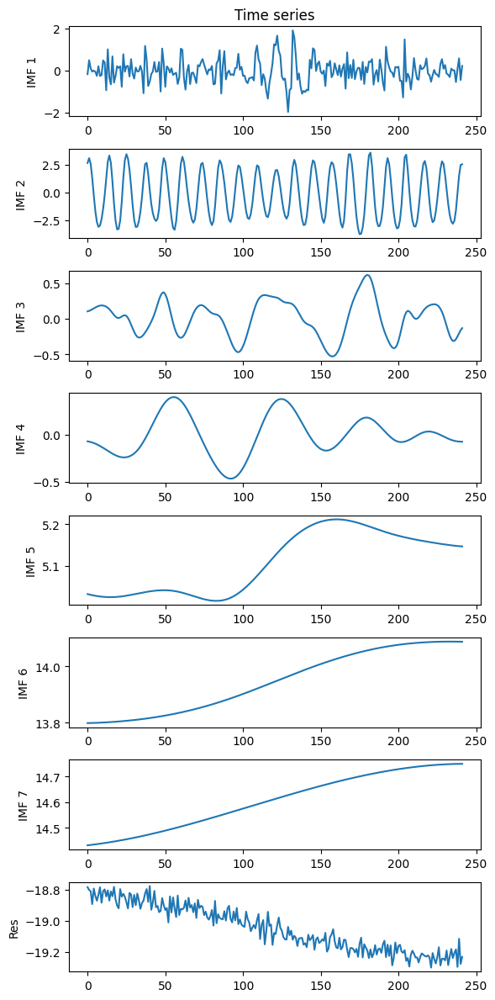

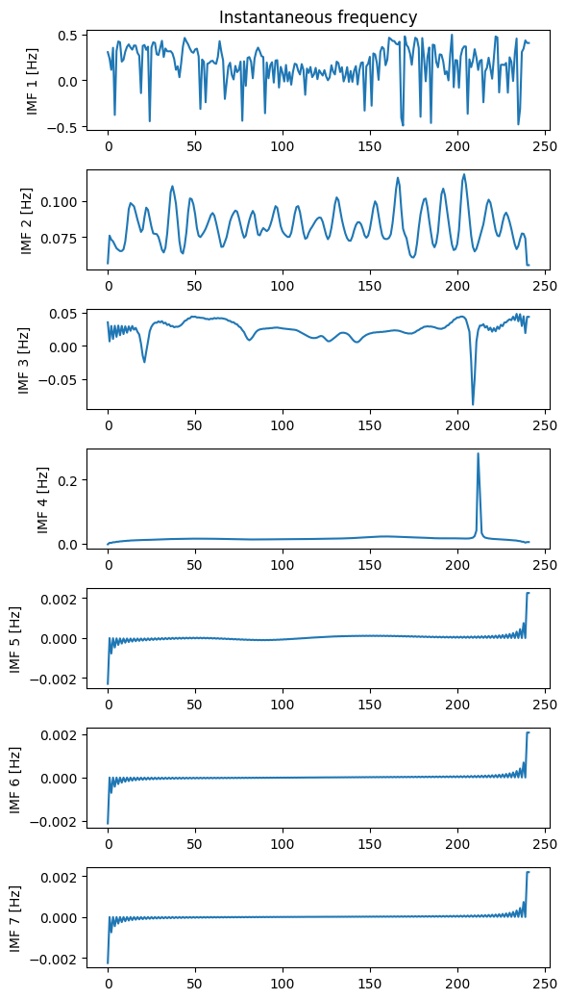

In [30]:
# Argo 月平均温度数据的周期性分析

# 选取站点检验剖面时间序列可靠性
from matplotlib import pyplot as plt
import numpy as np
from PyEMD import EEMD, Visualisation
from torch.utils.data import DataLoader

from src.dataset.Argo import Argo3DTemperatureDataset
from src.plot.base import create_shared_axes
from src.dataset.Argo import depthMap

ax = create_shared_axes(1, 1, 'x')
ax.figure.set_size_inches(10, 5)

for i, station in enumerate(stations):
    lon, lat = station['position']
    
    dataset = Argo3DTemperatureDataset([lon, lon + 1], [lat, lat + 1], [0, 58])
    loader = DataLoader(dataset, batch_size=len(dataset), shuffle=False)
    
    input, output = next(iter(loader))

    profile = output[:, 0, :35].numpy().T

    # 将 depth 设置为 Y 轴刻度
    ax.set_yticks(np.arange(0, len(depthMap[:35]), 5))
    # 设置对应的深度值标签
    ax.set_yticklabels(depthMap[:35][::5])
    
    # 设置 X 轴刻度，2004年1月到2024年3月
    ax.set_xticks(np.arange(0, 242, 24))
    # 设置小刻度
    ax.set_xticks(np.arange(0, 242, 12), minor=True)
    ax.set_xticklabels(np.arange(2004, 2025, 2))

    ax.contourf(profile)
    ax.contour(profile, colors='black', alpha=0.5, linewidths=0.2, linestyles='--', levels=30)
    contour_lines = ax.contour(profile, colors='black', linewidths=0.5)
    # 修改文本位置到左上角，使用相对坐标
    ax.text(0.02, 0.12, f"{station['detail']}", 
            fontsize=8, 
            color='orange',
            transform=ax.transAxes,  # 使用相对坐标系统
            verticalalignment='bottom'
    )
    labels = ax.clabel(contour_lines, inline=True, fontsize=5, fmt='%d', manual=False)

    # 为每个标签添加白色背景
    for label in labels:
        label.set_bbox(dict(facecolor='white', edgecolor='none', alpha=0.7, pad=0.5))
        
    ax.invert_yaxis()
    
    t = np.arange(0, 242, 1)
    eemd = EEMD()
    eemd.eemd(profile[0, :], t)
    imfs, res = eemd.get_imfs_and_residue()
    
    vis = Visualisation()
    vis.plot_imfs(imfs, res, t)
    vis.plot_instant_freq(t, imfs=imfs)
    vis.show()
    
    

In [16]:
# ERA5 月平均海表温度数据

from src.dataset.ERA5 import ERA5SSTMonthlyDataset
from src.plot.sst import plot_sst

dataset = ERA5SSTMonthlyDataset(2, 0, [-180, 180], [-80, 80])

input, output = next(iter(dataset))

output = output.detach().numpy()[0, :, :]

plot_sst(output, dataset.lon, dataset.lat, 0.5)

print(f"fore_: {input.shape}, pred: {output.shape}")


lon_indices: [  0.   2.   4.   6.   8.  10.  12.  14.  16.  18.  20.  22.  24.  26.
  28.  30.  32.  34.  36.  38.  40.  42.  44.  46.  48.  50.  52.  54.
  56.  58.  60.  62.  64.  66.  68.  70.  72.  74.  76.  78.  80.  82.
  84.  86.  88.  90.  92.  94.  96.  98. 100. 102. 104. 106. 108. 110.
 112. 114. 116. 118. 120. 122. 124. 126. 128. 130. 132. 134. 136. 138.
 140. 142. 144. 146. 148. 150. 152. 154. 156. 158. 160. 162. 164. 166.
 168. 170. 172. 174. 176. 178. 180. 182. 184. 186. 188. 190. 192. 194.
 196. 198. 200. 202. 204. 206. 208. 210. 212. 214. 216. 218. 220. 222.
 224. 226. 228. 230. 232. 234. 236. 238. 240. 242. 244. 246. 248. 250.
 252. 254. 256. 258. 260. 262. 264. 266. 268. 270. 272. 274. 276. 278.
 280. 282. 284. 286. 288. 290. 292. 294. 296. 298. 300. 302. 304. 306.
 308. 310. 312. 314. 316. 318. 320. 322. 324. 326. 328. 330. 332. 334.
 336. 338. 340. 342. 344. 346. 348. 350. 352. 354. 356. 358. 360. 362.
 364. 366. 368. 370. 372. 374. 376. 378. 380. 382. 384. 386. 388